In [1]:

#* Importing necessary libraries
import numpy as np
import os
import matplotlib.pyplot as plt
import pandas as pd
import time
import random
import torch
from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix


In [2]:

#* Question 1
# Following code cells correspond to question 1 of the assignment, which is the creation of a feedforward neural network.
# Question 1 is divided into 7 steps. Each step (or subquestion) will have its own code cell (or cells) and will be marked accordingly.

#* Step 1: Loading mfcc training, validation and testing data from respective files
# NOTE: The *mfcc* data is stored in folder 'music_genre_data_di', in respective subfolders ('train', 'val', 'test' and inside of them, subfolder 'mfccs'), 
# and are divided into two .npy files, which are numpy array files. 
# The 'X.npy' file contains our data, whereas the 'labels.npy' file contains the corresponding labels for the data.
# The data is loaded using the np.load() function, which loads the data from the .npy file into a numpy array.
# The data is, then, stored in variables X_train, y_train, X_val, y_val, X_test, y_test respectively.
# Convention: Since 'labels.npy' file contains string labels for the data, we will convert them to integer labels (0 to 3) for the purpose of training the neural network.

# A more dynamic approach to loading data and converting string labels to integers (0 to 3)
data_path = 'music_genre_data_di'
data_folders = ['train', 'val', 'test']
data_types = ['X', 'labels']
data_labels = ['blues', 'classical', 'hiphop', 'rock_metal_hardrock']
# Defining lists of numpy arrays for the data
X_data = []
y_data = []
for folder in data_folders:
    for data_type in data_types:
        if data_type == 'X':
            X = np.load(os.path.join(data_path, folder, 'mfccs', data_type + '.npy'))
            X_data.append(X)
        else:
            y = np.load(os.path.join(data_path, folder, 'mfccs', data_type + '.npy'))
            y = np.array([data_labels.index(x) for x in y])
            y_data.append(y)

# Getting the data
X_train, y_train, X_val, y_val, X_test, y_test = X_data[0], y_data[0], X_data[1], y_data[1], X_data[2], y_data[2]
print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)


(3200, 26) (3200,) (800, 26) (800,) (1376, 26) (1376,)


In [ ]:

#* Before moving on to any neural network definition, we need to define a function to set necessary seed for reproducibility.
# This will be incredibly useful for question 1, as it constitutes its first step and a fundamental part of the neural network training process.
def set_seed(seed = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# We set the seed for reproducibility
set_seed()

In [3]:

#* Pytorch data loading
# We, now, want to load our data to 3 pytorch dataloaders for training, validation and testing.
# We, initially, define a custom dataset class, which will be used to load our data.
# We train our data on the CPU, initially, so we need to define our data in a way that it can be loaded on the CPU.
device = torch.device('cpu') # This is the default device for the data

class MusicGenreDataset(Dataset):
    def __init__(self, X, y, device):
        self.X = torch.tensor(X, dtype = torch.float32, device = device)
        self.y = torch.tensor(y, dtype = torch.long, device = device)
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]
    
    
# Creating instances of our custom dataset class for training, validation and testing data
train_dataset = MusicGenreDataset(X_train, y_train, device)
val_dataset = MusicGenreDataset(X_val, y_val, device)
test_dataset = MusicGenreDataset(X_test, y_test, device)

# Creating dataloaders for training, validation and testing data, with a batch size of 16
batch_size = 16
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = True)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)

# Printing to check the shape of the data
for X, y in train_dataloader:
    print(X.shape, y.shape)
    break

for X, y in val_dataloader:
    print(X.shape, y.shape)
    break

for X, y in test_dataloader:
    print(X.shape, y.shape)
    break


torch.Size([16, 26]) torch.Size([16])
torch.Size([16, 26]) torch.Size([16])
torch.Size([16, 26]) torch.Size([16])


In [4]:

#* Step 2: Creating a feedforward neural network
# We define a fully connected neural network class, with the following architecture:
# 1. Input layer with 26 neurons (input features)
# 2. 3 hidden layers with 128, 32 and 4 neurons, respectively, where 4 is the number of predicted classes
# NOTE: We will NOT be using any activation function for the hidden layers.

class FeedForwardNN(torch.nn.Module):
    def __init__(self):
        super(FeedForwardNN, self).__init__() 
        self.fc1 = torch.nn.Linear(26, 128)
        self.fc2 = torch.nn.Linear(128, 32)
        self.fc3 = torch.nn.Linear(32, 4)
        
    def forward(self, x):
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x
    

# Creating an instance of the FeedForwardNN class
feed_forward_model = FeedForwardNN()
print(feed_forward_model)

# We use a sample input to check the output shape of the model
sample_input = torch.randn(batch_size, 26)
output = feed_forward_model(sample_input)
print(output.shape)

FeedForwardNN(
  (fc1): Linear(in_features=26, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=4, bias=True)
)
torch.Size([16, 4])


In [5]:

#* Step 3: Defining the model training function 
# We define a function, train_model, which will be used to train our model with these arguments, as inputs: epochs, optimizer, dataloader, loss function, model and a flag called 'get_best_model'.
# The 'get_best_model' flag is used to calculate and return the best model, based on the validation loss, when set to True. This will be incredibly useful in following assignment tasks.
# Function will carry out the following tasks:
# 1. Calculate model's output (forward pass), given the batch of input data
# 2. Calculate and print out loss using the loss function
# 3. Update the model's weights using the optimizer
# 4. Return the new neural network model, when training process is completed
def train_model(epochs, optimizer, dataloader, loss_function, model):
    # Setting the model to training mode
    model.train()

    # Training the model for the specified number of epochs
    for epoch in range(epochs):
        for index, (X, y) in enumerate(dataloader):
            # We move the input data and labels to the device
            X, y = X.to(device), y.to(device)
            
            # We zero the gradients for each batch, which is a necessary step before backpropagation to avoid accumulation of gradients
            optimizer.zero_grad()
            
            # We implement forward pass to get the model's predictions
            y_pred = model(X)
            
            # We calculate and print out the loss
            # print(y_pred.shape, y.shape)
            loss = loss_function(y_pred, y)
            
            print(f'Epoch: {epoch + 1}, Batch: {index + 1}, Loss: {loss.item()}') # .item() is used to get the scalar value of the loss
            
            # We, now, backpropagate the loss, in order to update the model's weights
            loss.backward()
            
            # We, then, update the model's weights
            optimizer.step()
        
    
    # We, finally, return the trained model        
    return model

In [6]:

#* Step 4: Defining the model evaluation function
# We, respectively, define a function, evaluate_model, which will be used to evaluate our model with these arguments, as inputs: dataloader, model and loss function.
# This function passes all input dataloader batches through the model, calculating the model's predictions without updating the weights.
# Using the model's predictions, function will both calculate and return the following:
# 1. Loss of the model
# 2. f1 averaged macro score of the model
# 3. Accuracy of the model
# 4. Confusion matrix of the model
def evaluate_model(dataloader, model, loss_function):
    # Setting the model to evaluation mode
    model.eval()
    
    # Initializing lists to store true labels and predicted labels
    true_labels = []
    predicted_labels = []
    total_loss = 0
    
    # Passing all input dataloader batches through the model
    with torch.no_grad(): # We do not need to calculate gradients for the evaluation process
        for X, y in dataloader:
            # We move the input data and labels to the device
            X, y = X.to(device), y.to(device)
            
            y_pred = model(X) # Getting the model's predictions via forward pass
            loss = loss_function(y_pred, y)
            total_loss += loss.item()
            
            # We get the predicted labels by taking the index of the maximum value in the model's predictions
            predicted_labels.extend(torch.argmax(y_pred, dim = 1).cpu().numpy()) # .cpu() is used to move the tensor to cpu memory
            true_labels.extend(y.cpu().numpy())
            
    # Calculating model's loss, f1 score, accuracy and confusion matrix
    # Our model's loss is calculated as the average loss over all batches 
    average_loss = total_loss / len(dataloader)
    f1 = f1_score(true_labels, predicted_labels, average = 'macro')
    accuracy = accuracy_score(true_labels, predicted_labels)
    conf_matrix = confusion_matrix(true_labels, predicted_labels) 
    
    # We, finally, return the calculated loss, f1 score, accuracy and confusion matrix
    return average_loss, f1, accuracy, conf_matrix
    

In [7]:

#* Step 5: Training and evaluating the feedforward neural network (using CPU)
# We, now, train our feedforward neural network model using the training data.
# We use the following hyperparameters for training:
# 1. Number of epochs: 30
# 2. Learning rate: 0.002
# 3. Loss function: CrossEntropyLoss
# 4. Optimizer: Stochastic Gradient Descent (SGD)

# Defining the hyperparameters
epochs = 30
learning_rate = 0.002
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(feed_forward_model.parameters(), lr = learning_rate)

# Training the model
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
feed_forward_start = time.time()
trained_model = train_model(epochs, optimizer, train_dataloader, loss_function, feed_forward_model)
feed_forward_stop = time.time()

# Evaluating the model on the testing data
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')


Epoch: 1, Batch: 1, Loss: 1.8509684801101685
Epoch: 1, Batch: 2, Loss: 1.6149287223815918
Epoch: 1, Batch: 3, Loss: 1.5961604118347168
Epoch: 1, Batch: 4, Loss: 1.6573293209075928
Epoch: 1, Batch: 5, Loss: 1.366185188293457
Epoch: 1, Batch: 6, Loss: 1.5493475198745728
Epoch: 1, Batch: 7, Loss: 1.5663738250732422
Epoch: 1, Batch: 8, Loss: 1.4181368350982666
Epoch: 1, Batch: 9, Loss: 1.4711028337478638
Epoch: 1, Batch: 10, Loss: 1.4784201383590698
Epoch: 1, Batch: 11, Loss: 1.3947398662567139
Epoch: 1, Batch: 12, Loss: 1.4189505577087402
Epoch: 1, Batch: 13, Loss: 1.4003067016601562
Epoch: 1, Batch: 14, Loss: 1.4258639812469482
Epoch: 1, Batch: 15, Loss: 1.413132667541504
Epoch: 1, Batch: 16, Loss: 1.395340085029602
Epoch: 1, Batch: 17, Loss: 1.3720455169677734
Epoch: 1, Batch: 18, Loss: 1.393885850906372
Epoch: 1, Batch: 19, Loss: 1.449111819267273
Epoch: 1, Batch: 20, Loss: 1.385777235031128
Epoch: 1, Batch: 21, Loss: 1.4067639112472534
Epoch: 1, Batch: 22, Loss: 1.3792072534561157
Epo

In [8]:

#* Step 6: Training and evaluating the feedforward neural network (using GPU)
# We repeat the training and evaluation process of the feedforward neural network model, but this time using GPU.
# For that purpose, we first need to move our model and data to GPU memory.
# Since GPU is not available in local IDE, we will not be able to run this code cell.
# However, the code is written for the purpose of use in Google Colab. 
# Therefore, this code cell will not contain any code that corresponds to the training and evaluation process of step 5, 
# but the respective code cell of the Google Colab notebook file will.

# Moving the model to GPU memory
print("Is GPU available?", torch.cuda.is_available()) # Written for demonstration purposes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Before training the model, we have to make sure that both the model AND data are moved to GPU memory.

# # Moving our data to GPU memory, by creating new instances of our custom dataset class
# train_dataset_gpu = MusicGenreDataset(X_train, y_train, device)
# val_dataset_gpu = MusicGenreDataset(X_val, y_val, device)
# test_dataset_gpu = MusicGenreDataset(X_test, y_test, device)

# # Creating dataloaders for training, validation and testing data, with a batch size of 16
# train_dataloader_gpu = DataLoader(train_dataset_gpu, batch_size = batch_size, shuffle = True)
# val_dataloader_gpu = DataLoader(val_dataset_gpu, batch_size = batch_size, shuffle = True)
# test_dataloader_gpu = DataLoader(test_dataset_gpu, batch_size = batch_size, shuffle = False)

# We move the model to GPU memory
feed_forward_model_gpu = FeedForwardNN().to(device)

# Also, we have to make sure we define the optimizer with the model's parameters, after moving the model to GPU memory
optimizer_gpu = torch.optim.SGD(feed_forward_model_gpu.parameters(), lr = learning_rate)

# Training the new model
# We, again, wish to time the training process, for the same training model inputs as before, in order to compare the training time between CPU and GPU
# We want to synchronize the training process, in order to compare the training time between CPU and GPU
feed_forward_start_gpu = time.time()
trained_model_gpu = train_model(epochs, optimizer_gpu, train_dataloader, loss_function, feed_forward_model_gpu)
feed_forward_stop_gpu = time.time()

# Evaluating the new model on the new testing data
val_loss_gpu, val_f1_gpu, val_accuracy_gpu, val_conf_matrix_gpu = evaluate_model(test_dataloader, trained_model_gpu, loss_function)

# Printing the evaluation results
print(f'Loss (GPU): {val_loss_gpu}')
print(f'F1 Score (GPU): {val_f1_gpu}')
print(f'Accuracy (GPU): {val_accuracy_gpu}')


Is GPU available? False
Epoch: 1, Batch: 1, Loss: 1.3824056386947632
Epoch: 1, Batch: 2, Loss: 1.2709888219833374
Epoch: 1, Batch: 3, Loss: 1.492391586303711
Epoch: 1, Batch: 4, Loss: 1.2321884632110596
Epoch: 1, Batch: 5, Loss: 1.4993031024932861
Epoch: 1, Batch: 6, Loss: 1.4617937803268433
Epoch: 1, Batch: 7, Loss: 1.3082787990570068
Epoch: 1, Batch: 8, Loss: 1.5953819751739502
Epoch: 1, Batch: 9, Loss: 1.3960726261138916
Epoch: 1, Batch: 10, Loss: 1.2755718231201172
Epoch: 1, Batch: 11, Loss: 1.4457224607467651
Epoch: 1, Batch: 12, Loss: 1.4377278089523315
Epoch: 1, Batch: 13, Loss: 1.4114359617233276
Epoch: 1, Batch: 14, Loss: 1.401975154876709
Epoch: 1, Batch: 15, Loss: 1.3499609231948853
Epoch: 1, Batch: 16, Loss: 1.370334506034851
Epoch: 1, Batch: 17, Loss: 1.3769359588623047
Epoch: 1, Batch: 18, Loss: 1.3726294040679932
Epoch: 1, Batch: 19, Loss: 1.371658205986023
Epoch: 1, Batch: 20, Loss: 1.4201031923294067
Epoch: 1, Batch: 21, Loss: 1.3737876415252686
Epoch: 1, Batch: 22, Lo

In [9]:

#* Model comparisons (CPU vs GPU)
# We, now, print the time differences of models trained on CPU and GPU, to see if there is any difference in the results.
print("Time differences")
print(f'Training time on CPU: {feed_forward_stop - feed_forward_start} seconds')
print(f'Training time on GPU: {feed_forward_stop_gpu - feed_forward_start_gpu} seconds')
# We, now, print the evaluation results of the models trained on CPU and GPU, to see if there is any difference in the results.
print("Evaluation results")
print("CPU:")
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print("GPU:")
print(f'Loss: {val_loss_gpu}')
print(f'F1 Score: {val_f1_gpu}')
print(f'Accuracy: {val_accuracy_gpu}')

# We notice that the training time on GPU is a little bit faster on CPU, but the evaluation results, either for the average loss, f1 or accuracy score,
# are definitely better on GPU.
# This is expected, as GPU is generally more efficient in handling large amounts of data and complex computations, compared to CPU.

Time differences
Training time on CPU: 6.524888515472412 seconds
Training time on GPU: 6.056783437728882 seconds
Evaluation results
CPU:
Loss: 0.9804918036557907
F1 Score: 0.5530396936687736
Accuracy: 0.5734011627906976
GPU:
Loss: 0.9582631497882134
F1 Score: 0.5985637773348396
Accuracy: 0.6199127906976745


In [10]:

#* Step 7: Modifying the model training process, to get the model with the best generalization performance
# With this modification, we use the validation dataset at the end of each epoch, to check the model's performance on the validation data.
# Essentially, on each epoch we get models with different weights.
# We, then, select the model with the best generalization performance, which is the model that performs the best on the validation data.
# Specifically, we want to pinpoint and return the model with the best f1 performance on the validation data, which we will later use to evaluate the model on the test data.

# We define a new training function, train_model_best, which will be used to train our model with these arguments, as inputs: epochs, optimizer, dataloader, loss function and model.
# This is done, because we will be using the 'evaluate_model' function to evaluate the model on the validation data, at the end of each epoch, which is a step after the model training function definition.
# This function carries out the following tasks:
# 1. Calculate model's output (forward pass), given the batch of input data
# 2. Calculate and print out loss using the loss function
# 3. Update the model's weights using the optimizer
# 4. Evaluate the model on the validation data, using the evaluate_model function
# 5. Save the model with the best f1 score on the validation data
# 6. Return the best model, based on the validation f1 score
device = torch.device('cpu') # This is the default device for the data
def train_model_best(epochs, optimizer, dataloader, val_dataloader, loss_function, model):
    # Setting the model to training mode
    model.train()
    
    # Initializing the best f1 score on the validation data
    best_f1 = 0
    
    # Training the model for the specified number of epochs
    for epoch in range(epochs):
        for index, (X, y) in enumerate(dataloader):
            # We move the input data and labels to the device
            X, y = X.to(device), y.to(device)
            
            # We zero the gradients for each batch, which is a necessary step before backpropagation to avoid accumulation of gradients
            optimizer.zero_grad()
            
            # We implement forward pass to get the model's predictions
            y_pred = model(X)
            
            # We calculate and print out the loss
            loss = loss_function(y_pred, y)
            print(f'Epoch: {epoch + 1}, Batch: {index + 1}, Loss: {loss.item()}') # .item() is used to get the scalar value of the loss
            
            # We, now, backpropagate the loss, in order to update the model's weights
            loss.backward()
            
            # We, then, update the model's weights
            optimizer.step()
        
        # Evaluating the model on the validation data
        _, val_f1, _, _ = evaluate_model(val_dataloader, model, loss_function)
        
        # Saving the model with the best f1 score on the validation data
        if val_f1 > best_f1:
            best_f1 = val_f1
            best_model = model.state_dict() # 'state_dict' refers to, practically, a dictionary object that maps each layer to its parameter tensor, holding the weights and biases of the model
        
    # We, finally, load the best model and return it
    model.load_state_dict(best_model)
    return model


In [11]:
# In this code cell, we train our feedforward neural network model using the training data, but this time we use the 'train_model_best' function.
# We use the same hyperparameters for training as before.

# Training the model
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_model_best = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, feed_forward_model)
stop = time.time()

# Evaluating the model on the testing data
val_loss_best, val_f1_best, val_accuracy_best, val_conf_matrix_best = evaluate_model(test_dataloader, trained_model_best, loss_function)

# Printing the evaluation results
print(f'Loss (Best Model): {val_loss_best}')
print(f'F1 Score (Best Model): {val_f1_best}')
print(f'Accuracy (Best Model): {val_accuracy_best}')
print(f"Training time (Best Model): {stop - start} seconds")


Epoch: 1, Batch: 1, Loss: 0.9597079753875732
Epoch: 1, Batch: 2, Loss: 1.1004828214645386
Epoch: 1, Batch: 3, Loss: 0.7814969420433044
Epoch: 1, Batch: 4, Loss: 1.2005492448806763
Epoch: 1, Batch: 5, Loss: 0.8776695728302002
Epoch: 1, Batch: 6, Loss: 0.727294385433197
Epoch: 1, Batch: 7, Loss: 1.0261895656585693
Epoch: 1, Batch: 8, Loss: 0.990009605884552
Epoch: 1, Batch: 9, Loss: 0.8787722587585449
Epoch: 1, Batch: 10, Loss: 0.7775741815567017
Epoch: 1, Batch: 11, Loss: 1.2094690799713135
Epoch: 1, Batch: 12, Loss: 1.0141507387161255
Epoch: 1, Batch: 13, Loss: 1.120168685913086
Epoch: 1, Batch: 14, Loss: 0.6717700362205505
Epoch: 1, Batch: 15, Loss: 1.5997923612594604
Epoch: 1, Batch: 16, Loss: 0.9429450035095215
Epoch: 1, Batch: 17, Loss: 0.914429783821106
Epoch: 1, Batch: 18, Loss: 1.0322728157043457
Epoch: 1, Batch: 19, Loss: 1.0704048871994019
Epoch: 1, Batch: 20, Loss: 0.6537802815437317
Epoch: 1, Batch: 21, Loss: 0.9610010981559753
Epoch: 1, Batch: 22, Loss: 0.7958610653877258
E

(3200, 21, 128) (3200,) (800, 21, 128) (800,) (1376, 21, 128) (1376,)


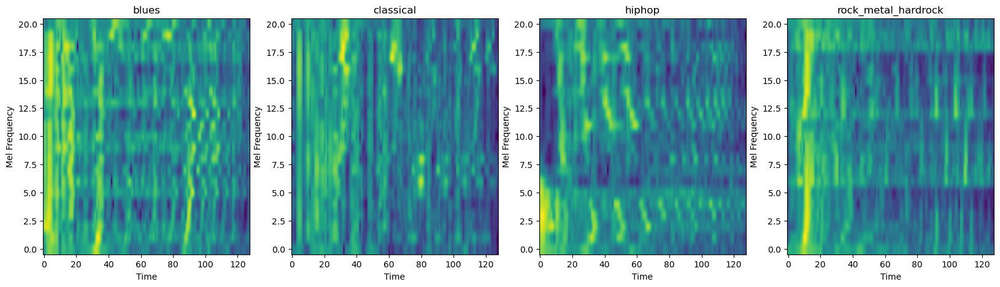

In [12]:

#* Question 2 
# Following code cells correspond to question 2 of the assignment, which is the creation, training and evaluation of a Convolutional Neural Network (CNN).
# This question is divided into 5 steps. Each step (or subquestion) will have its own code cell (or cells) and will be marked accordingly.

#* Step 1: Loading spectrogram training, validation and testing data from respective files
# Process is similar to the one used in question 1, but this time we load the spectrogram data from the respective files.
data_path = 'music_genre_data_di'
data_folders = ['train', 'val', 'test']
data_types = ['X', 'labels']
data_labels = ['blues', 'classical', 'hiphop', 'rock_metal_hardrock']
# Re-defining lists of numpy arrays for the data
X_data = []
y_data = []
for folder in data_folders:
    for data_type in data_types:
        if data_type == 'X':
            X = np.load(os.path.join(data_path, folder, 'melgrams', data_type + '.npy'))
            X_data.append(X)
        else:
            y = np.load(os.path.join(data_path, folder, 'melgrams', data_type + '.npy'))
            y = np.array([data_labels.index(x) for x in y])
            y_data.append(y)

# Getting the data
X_train, y_train, X_val, y_val, X_test, y_test = X_data[0], y_data[0], X_data[1], y_data[1], X_data[2], y_data[2]
print(X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape)

# We, additionally, want to print out a random mel-spectrogram (or melgram) image of each class, to see how the data looks like
# To do this, we will use the matplotlib library
# We will plot the mel-spectrogram images of a random instance of each class
fig, axs = plt.subplots(1, 4, figsize = (20, 5))
for i in range(4):
    random_index = np.random.choice(np.where(y_train == i)[0])
    axs[i].imshow(X_train[random_index], aspect = 'auto', origin = 'lower')
    axs[i].set_xlabel('Time')
    axs[i].set_ylabel('Mel Frequency')
    axs[i].set_title(data_labels[i])
plt.show()

In [13]:

#* Step 2: Creating a Convolutional Neural Network (CNN) using Pytorch
# In this step, we define a Convolutional Neural Network (CNN) class with the following architecture:
# 1. Input layer with 1 channel (mel-spectrogram images).
# 2. 4 convolutional layers with 16, 32, 64, and 128 filters, respectively, so as to achieve the channel sequence of 1, 16, 32, 64 and 128. Kernel size is 5.
# 3. The last layer's output is flattened and passed through a fully connected neural network with 4 neurons, which is the number of predicted classes, with these neurons:
# x (dimension of CNN output), 1024, 256, 32, 'out_dim'.
# NOTE: We will NOT be using any activation function for the convolutional layers.

# We start off by defining the CNN class
kernel_size = 5
out_dim = 4
class CNN(torch.nn.Module):
    def __init__(self, kernel_size = kernel_size, out_dim = out_dim):
        super(CNN, self).__init__()
        self.conv1 = torch.nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = kernel_size)
        self.conv2 = torch.nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = kernel_size)
        self.conv3 = torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = kernel_size)
        self.conv4 = torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = kernel_size)

        # The first fully connected layer has as many neurons as the output of the last convolutional layer
        # The last convolutional layer has 128 channels, 5 height and 112 width, which was calculated as such:
        # 1. The input image has a shape of (batch_size, 1, 21, 128)
        # 2. The first convolutional layer has 16 filters, which results in 16 channels, 17 height and 124 width
        # 3. The second convolutional layer has 32 filters, which results in 32 channels, 13 height and 120 width
        # 4. The third convolutional layer has 64 filters, which results in 64 channels, 9 height and 116 width
        # 5. The fourth convolutional layer has 128 filters, which results in 128 channels, 5 height and 112 width
        # 6. The output of the last convolutional layer is flattened, which results in 128 * 5 * 112 neurons

        self.fc1 = torch.nn.Linear(128 * 5 * 112, 1024)
        # self.fc1 = torch.nn.Linear(128 * out_dim * out_dim, 1024)
        self.fc2 = torch.nn.Linear(1024, 256)
        self.fc3 = torch.nn.Linear(256, 32)
        self.fc4 = torch.nn.Linear(32, out_dim)

    def forward(self, x): # We define the forward pass of the CNN in the forward function, which is necessary for the model to know how to pass the input data through the layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = x.view(x.size(0), -1)  # We flatten the output of the last convolutional layer based on the output dimension
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
        return x


# Creating an instance of the CNN class
cnn_model = CNN()
print(cnn_model)

# Testing our model with a random mel-spectrogram image
sample_input = torch.randn(batch_size, 1, 21, 128) # We define the input shape as (batch_size, channels, height, width)
output = cnn_model(sample_input)
print(output.shape)

CNN(
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
  (fc1): Linear(in_features=71680, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=32, bias=True)
  (fc4): Linear(in_features=32, out_features=4, bias=True)
)
torch.Size([16, 4])


In [14]:

#* Step 3: Training and evaluating the Convolutional Neural Network (CNN) model
# In the following code cells, we train our CNN model (initially on the CPU) using our training data.

device = torch.device('cpu') # This is the default device for the data

# We need to redefine our custom dataset class, MusicGenreDataset, to load our mel-spectrogram data
class MusicGenreDataset(Dataset):
    def __init__(self, X, y, device):
        self.X = torch.tensor(X, dtype = torch.float32, device = device).unsqueeze(1) # We add a channel dimension to the data
        self.y = torch.tensor(y, dtype = torch.long, device = device)
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


# We, now, need to reload our new data to 3 new pytorch dataloaders for training, validation and testing.
train_dataset = MusicGenreDataset(X_train, y_train, device)
val_dataset = MusicGenreDataset(X_val, y_val, device)
test_dataset = MusicGenreDataset(X_test, y_test, device)

# Creating dataloaders for training, validation and testing data, with a batch size of 16
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(val_dataset, batch_size = batch_size, shuffle = True)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)

# Printing to check the shape of the data
for X, y in train_dataloader:
    print(X.shape, y.shape)
    break

for X, y in val_dataloader:
    print(X.shape, y.shape)
    break

for X, y in test_dataloader:
    print(X.shape, y.shape)
    break


torch.Size([16, 1, 21, 128]) torch.Size([16])
torch.Size([16, 1, 21, 128]) torch.Size([16])
torch.Size([16, 1, 21, 128]) torch.Size([16])


In [15]:
# Redefining the optimizer for the CNN model (hyperparameters are the same as before)
optimizer = torch.optim.SGD(cnn_model.parameters(), lr = learning_rate)

# Training the model (on CPU)
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_cnn_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_model)
stop = time.time()

# Evaluating the model on the testing data (on CPU)
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')


Epoch: 1, Batch: 1, Loss: 1.4796338081359863
Epoch: 1, Batch: 2, Loss: 24.851520538330078
Epoch: 1, Batch: 3, Loss: 17.26759147644043
Epoch: 1, Batch: 4, Loss: 69.76438903808594
Epoch: 1, Batch: 5, Loss: 1.5778636932373047
Epoch: 1, Batch: 6, Loss: 978.4358520507812
Epoch: 1, Batch: 7, Loss: 37570146304.0
Epoch: 1, Batch: 8, Loss: nan
Epoch: 1, Batch: 9, Loss: nan
Epoch: 1, Batch: 10, Loss: nan
Epoch: 1, Batch: 11, Loss: nan
Epoch: 1, Batch: 12, Loss: nan
Epoch: 1, Batch: 13, Loss: nan
Epoch: 1, Batch: 14, Loss: nan
Epoch: 1, Batch: 15, Loss: nan
Epoch: 1, Batch: 16, Loss: nan
Epoch: 1, Batch: 17, Loss: nan
Epoch: 1, Batch: 18, Loss: nan
Epoch: 1, Batch: 19, Loss: nan
Epoch: 1, Batch: 20, Loss: nan
Epoch: 1, Batch: 21, Loss: nan
Epoch: 1, Batch: 22, Loss: nan
Epoch: 1, Batch: 23, Loss: nan
Epoch: 1, Batch: 24, Loss: nan
Epoch: 1, Batch: 25, Loss: nan
Epoch: 1, Batch: 26, Loss: nan
Epoch: 1, Batch: 27, Loss: nan
Epoch: 1, Batch: 28, Loss: nan
Epoch: 1, Batch: 29, Loss: nan
Epoch: 1, Bat

In [16]:
# Training and evaluating our current CNN model on the GPU, as well.

# Moving the model to GPU memory
print("Is GPU available?", torch.cuda.is_available()) # Written for demonstration purposes
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cnn_model_gpu = CNN().to(device)

# Also, we have to make sure we define the optimizer with the model's parameters, after moving the model to GPU memory
optimizer_gpu = torch.optim.SGD(cnn_model_gpu.parameters(), lr = learning_rate)

# Training the new model
start_gpu = time.time()
trained_cnn_model_gpu = train_model_best(epochs, optimizer_gpu, train_dataloader, val_dataloader, loss_function, cnn_model_gpu)
stop_gpu = time.time()

# Evaluating the new model on the new testing data
val_loss_gpu, val_f1_gpu, val_accuracy_gpu, val_conf_matrix_gpu = evaluate_model(test_dataloader, trained_cnn_model_gpu, loss_function)

# Printing the evaluation results
print(f'Loss (GPU): {val_loss_gpu}')
print(f'F1 Score (GPU): {val_f1_gpu}')
print(f'Accuracy (GPU): {val_accuracy_gpu}')


Is GPU available? False
Epoch: 1, Batch: 1, Loss: 1.454638957977295
Epoch: 1, Batch: 2, Loss: 6.24650239944458
Epoch: 1, Batch: 3, Loss: 2.1050868034362793
Epoch: 1, Batch: 4, Loss: 2.2263901233673096
Epoch: 1, Batch: 5, Loss: 9.409904479980469
Epoch: 1, Batch: 6, Loss: 2.336743116378784
Epoch: 1, Batch: 7, Loss: 6.322107315063477
Epoch: 1, Batch: 8, Loss: 4.983981132507324
Epoch: 1, Batch: 9, Loss: 60.94992446899414
Epoch: 1, Batch: 10, Loss: 62.600181579589844
Epoch: 1, Batch: 11, Loss: 2164.76953125
Epoch: 1, Batch: 12, Loss: 556226838528.0
Epoch: 1, Batch: 13, Loss: nan
Epoch: 1, Batch: 14, Loss: nan
Epoch: 1, Batch: 15, Loss: nan
Epoch: 1, Batch: 16, Loss: nan
Epoch: 1, Batch: 17, Loss: nan
Epoch: 1, Batch: 18, Loss: nan
Epoch: 1, Batch: 19, Loss: nan
Epoch: 1, Batch: 20, Loss: nan
Epoch: 1, Batch: 21, Loss: nan
Epoch: 1, Batch: 22, Loss: nan
Epoch: 1, Batch: 23, Loss: nan
Epoch: 1, Batch: 24, Loss: nan
Epoch: 1, Batch: 25, Loss: nan
Epoch: 1, Batch: 26, Loss: nan
Epoch: 1, Batch:

In [17]:

#* Model comparisons (CPU vs GPU)
# We, now, print the time differences of models trained on CPU and GPU, to see if there is any difference in the results.
print("Time differences")
print("CNN:")
print(f'Training time on CPU: {stop - start} seconds')
print(f'Training time on GPU: {stop_gpu - start_gpu} seconds')
print("Feedforward NN:")
print(f'Training time on CPU: {feed_forward_stop - feed_forward_start} seconds')
print(f'Training time on GPU: {feed_forward_stop_gpu - feed_forward_start_gpu} seconds')

# We, now, print the evaluation results of the models trained on CPU and GPU, to see if there is any difference in the results.
print("Evaluation results of current CNN model")
print("CPU:")
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print("GPU:")
print(f'Loss: {val_loss_gpu}')
print(f'F1 Score: {val_f1_gpu}')
print(f'Accuracy: {val_accuracy_gpu}')

# When evaluating our CNN model on the testing data WITHOUT applying any activation functions, pooling or padding, we notice that the model is not performing well, whether we're
# moving the model and data on GPU memory or not. 
# As a result, some loss function scores are high, whereas most are nan values, making it difficult to evaluate the model's performance. Calculated f1 and accuracy scores are also very low.
# As per time execution, we notice that both the training time and evaluation results, either for the average loss, f1 or accuracy score, are about the same on both CPU and GPU.
# However, we can see that the training time, on either CPU or GPU, is faster for the feedforward neural network model, compared to the CNN one.
# This is due to the fact that the CNN model is more complex, as it has more layers and filters, which makes it more computationally expensive to train and evaluate.
# Another factor that has contributed to the poor performance of the CNN model is the lack of activation functions, pooling and padding layers, as was prementioned.
# Therefore, it's extremely difficult to train and evaluate the model using the current architecture.


Time differences
CNN:
Training time on CPU: 1489.5486829280853 seconds
Training time on GPU: 1558.1500120162964 seconds
Feedforward NN:
Training time on CPU: 6.524888515472412 seconds
Training time on GPU: 6.056783437728882 seconds
Evaluation results of current CNN model
CPU:
Loss: nan
F1 Score: 0.09529411764705882
Accuracy: 0.23546511627906977
GPU:
Loss: nan
F1 Score: 0.09529411764705882
Accuracy: 0.23546511627906977


In [18]:

#* Step 4: Modifying the CNN model architecture
# In this step, we will modify the CNN model architecture, by adding just pooling and padding layers, in order to improve its performance.

# We define a new CNN class, CNNModified, which will have the following architecture:
# 1. Input layer with 1 channel (mel-spectrogram images).
# 2. 4 convolutional layers with 16, 32, 64, and 128 filters, respectively, so as to achieve the channel sequence of 1, 16, 32, 64 and 128. Kernel size is 5.
# 3. We add a max pooling layer after each convolutional layer, with a kernel size of 2.
# 4. We, also, apply padding with a size of 2 within each convolutional layer.
# 5. The last layer's output is flattened and passed through a fully connected neural network with 4 neurons, which is the number of predicted classes, with these neurons:
# x (dimension of CNN output), 1024, 256, 32, 'out_dim'.
# NOTE: We will still NOT be using any activation function for the convolutional layers.

# We start off by defining the CNNModified class, which is a modified version of the CNN class
class CNNModified (torch.nn.Module):
    def __init__(self, kernel_size = kernel_size, out_dim = out_dim): 
        super(CNNModified, self).__init__()
        
        self.conv1 = torch.nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = kernel_size, padding = 2)
        self.conv2 = torch.nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = kernel_size, padding = 2)
        self.conv3 = torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = kernel_size, padding = 2)
        self.conv4 = torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = kernel_size, padding = 2)
        
        # We define our max pooling layer
        self.pool = torch.nn.MaxPool2d(kernel_size = 2)

        # The first fully connected layer has as many neurons as the output of the last convolutional layer, which is 128 * 1 * 8
        # This is why:
        # conv1: (batch_size, 1, 21, 128) -> (batch_size, 16, 21, 128)
        # pool1: (batch_size, 16, 21, 128) -> (batch_size, 16, 10, 64)
        # conv2: (batch_size, 16, 10, 64) -> (batch_size, 32, 10, 64)
        # pool2: (batch_size, 32, 10, 64) -> (batch_size, 32, 5, 32)
        # conv3: (batch_size, 32, 5, 32) -> (batch_size, 64, 5, 32)
        # pool3: (batch_size, 64, 5, 32) -> (batch_size, 64, 2, 16)
        # conv4: (batch_size, 64, 2, 16) -> (batch_size, 128, 2, 16)
        # pool4: (batch_size, 128, 2, 16) -> (batch_size, 128, 1, 8)
        
        self.fc1 = torch.nn.Linear(128 * 1 * 8, 1024)
        self.fc2 = torch.nn.Linear(1024, 256)
        self.fc3 = torch.nn.Linear(256, 32)
        self.fc4 = torch.nn.Linear(32, out_dim)
        
    def forward(self, x): # We define the forward pass of the CNN in the forward function, which is necessary for the model to know how to pass the input data through the layers
       
        x = self.pool(self.conv1(x))
        x = self.pool(self.conv2(x))
        x = self.pool(self.conv3(x))
        x = self.pool(self.conv4(x))
        
        x = x.view(x.size(0), -1)  # We flatten the output of the  last convolutional layer based on the output dimension

        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        x = self.fc4(x)
      
        return x
    
# Creating an instance of the CNNModified class
cnn_modified_model = CNNModified()
print(cnn_modified_model)

# Testing our model with a random mel-spectrogram image
sample_input = torch.randn(batch_size, 1, 21, 128) # We define the input shape as (batch_size, channels, height, width)
output = cnn_modified_model(sample_input)
print(output.shape)


CNNModified(
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=32, bias=True)
  (fc4): Linear(in_features=32, out_features=4, bias=True)
)
torch.Size([16, 4])


In [19]:
# So, now, we train and evaluate our modified CNN model (on CPU) using our training data.
device = torch.device('cpu') # This is the default device for the data

# Redefining the optimizer for the CNNModified model (hyperparameters are the same as before)
optimizer = torch.optim.SGD(cnn_modified_model.parameters(), lr = learning_rate)

# Training the model (on CPU)
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_cnn_modified_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_modified_model)
stop = time.time()

# Evaluating the model on the testing data (on CPU)
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_modified_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print(f"Training time: {stop - start} seconds")

# We notice that the model's performance has improved significantly, compared to the previous CNN model, as the average loss, f1 and accuracy scores are much better.
# On average, both f1 and accuracy scores are around 0.7, which is a significant improvement from the previous CNN model.
# Time execution is also faster, compared to the previous CNN model.
# This was expected, as the addition of pooling and padding layers has helped the model to learn better features from the data.
# Each pooling layer reduces the spatial dimensions of the data, which helps to reduce the number of parameters and computations in the network.
# The padding layers, on the other hand, help to preserve the spatial dimensions of the data by adding zeros around it, which helps to prevent the loss of information at the edges of the data.
# As a result, the model is able to learn better features from the data, which leads to better performance on the testing data.

Epoch: 1, Batch: 1, Loss: 1.3679531812667847
Epoch: 1, Batch: 2, Loss: 1.4111924171447754
Epoch: 1, Batch: 3, Loss: 1.4150474071502686
Epoch: 1, Batch: 4, Loss: 1.4031919240951538
Epoch: 1, Batch: 5, Loss: 1.429168462753296
Epoch: 1, Batch: 6, Loss: 1.3757073879241943
Epoch: 1, Batch: 7, Loss: 1.3678839206695557
Epoch: 1, Batch: 8, Loss: 1.3669501543045044
Epoch: 1, Batch: 9, Loss: 1.45993173122406
Epoch: 1, Batch: 10, Loss: 1.4004669189453125
Epoch: 1, Batch: 11, Loss: 1.4154014587402344
Epoch: 1, Batch: 12, Loss: 1.4104899168014526
Epoch: 1, Batch: 13, Loss: 1.3807857036590576
Epoch: 1, Batch: 14, Loss: 1.4111342430114746
Epoch: 1, Batch: 15, Loss: 1.3743149042129517
Epoch: 1, Batch: 16, Loss: 1.4137916564941406
Epoch: 1, Batch: 17, Loss: 1.474969506263733
Epoch: 1, Batch: 18, Loss: 1.3850281238555908
Epoch: 1, Batch: 19, Loss: 1.3276779651641846
Epoch: 1, Batch: 20, Loss: 1.400286316871643
Epoch: 1, Batch: 21, Loss: 1.4427491426467896
Epoch: 1, Batch: 22, Loss: 1.4586528539657593
Ep

In [20]:

#* Step 5: Modifying our CNN model, yet again, to add activation functions
# In the following code cells, we will redefine our CNN model architecture, by adding activation functions before every convolutional layer, in order to improve its performance.
# We're also going to add activation functions before every fully connected layer, as well.
# We will use the ReLU activation function, which is a popular choice for deep learning models. We will both train and evaluate our modified CNN model (on CPU) using our training data.

# We define a new CNN class, CNNModifiedActivation, which will have the following architecture:
# 1. Input layer with 1 channel (mel-spectrogram images).
# 2. Activation function (ReLU), which is defined only once inside our class.
# 3. 4 convolutional layers with 16, 32, 64, and 128 filters, respectively, so as to achieve the channel sequence of 1, 16, 32, 64 and 128. Kernel size is 5.
# 4. We add a max pooling layer after every convolutional layer, with a kernel size of 2.
# 5. We, also, apply padding with a size of 2 within each convolutional layer.
# 6. Activation function (ReLU) before every fully connected layer.
# 7. The last layer's output is flattened and passed through a fully connected neural network with 4 neurons, which is the number of predicted classes, with these neurons:
# x (dimension of CNN output), 1024, 256, 32, 'out_dim'.

# We start off by defining the CNNActivation class, which is a modified version of the CNNModified class
class CNNActivation (torch.nn.Module):
  def __init__(self, kernel_size = kernel_size, out_dim = out_dim): 
    super(CNNActivation, self).__init__()
    
    self.relu = torch.nn.ReLU() # Definition of the ReLU activation function
     
    self.conv1 = torch.nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = kernel_size, padding = 2)
    self.conv2 = torch.nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = kernel_size, padding = 2)
    self.conv3 = torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = kernel_size, padding = 2)
    self.conv4 = torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = kernel_size, padding = 2)
    
    # We define our max pooling layer
    self.pool = torch.nn.MaxPool2d(kernel_size = 2)

    # The first fully connected layer has as many neurons as the output of the last convolutional layer, which is 128 * 1 * 8
    # This is why:
    # conv1: (batch_size, 1, 21, 128) -> (batch_size, 16, 21, 128)
    # pool1: (batch_size, 16, 21, 128) -> (batch_size, 16, 10, 64)
    # conv2: (batch_size, 16, 10, 64) -> (batch_size, 32, 10, 64)
    # pool2: (batch_size, 32, 10, 64) -> (batch_size, 32, 5, 32)
    # conv3: (batch_size, 32, 5, 32) -> (batch_size, 64, 5, 32)
    # pool3: (batch_size, 64, 5, 32) -> (batch_size, 64, 2, 16)
    # conv4: (batch_size, 64, 2, 16) -> (batch_size, 128, 2, 16)
    # pool4: (batch_size, 128, 2, 16) -> (batch_size, 128, 1, 8)
        
    self.fc1 = torch.nn.Linear(128 * 1 * 8, 1024)
    self.fc2 = torch.nn.Linear(1024, 256)
    self.fc3 = torch.nn.Linear(256, 32)
    self.fc4 = torch.nn.Linear(32, out_dim)
       
  def forward(self, x): # We modify the forward pass of the CNN, in order to include the ReLU activation function

    x = self.pool(self.relu(self.conv1(x)))
    x = self.pool(self.relu(self.conv2(x)))
    x = self.pool(self.relu(self.conv3(x)))
    x = self.pool(self.relu(self.conv4(x)))
    
    x = x.view(x.size(0), -1)  # We flatten the output of the last convolutional layer based on the output dimension
    
    x = self.relu(self.fc1(x))
    x = self.relu(self.fc2(x))
    x = self.relu(self.fc3(x))
    x = self.fc4(x)
  
    return x
  
# Creating an instance of the CNNModifiedActivation class
cnn_modified_activation_model = CNNActivation()
print(cnn_modified_activation_model)

# Testing our model with a random mel-spectrogram image
sample_input = torch.randn(batch_size, 1, 21, 128) # We define the input shape as (batch_size, channels, height, width)
output = cnn_modified_activation_model(sample_input)
print(output.shape)


CNNActivation(
  (relu): ReLU()
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=32, bias=True)
  (fc4): Linear(in_features=32, out_features=4, bias=True)
)
torch.Size([16, 4])


In [21]:
# So, now, we train and evaluate our modified CNN model (on CPU) using our training data.

# Redefining the optimizer for the CNNModifiedActivation model (hyperparameters are the same as before)
optimizer = torch.optim.SGD(cnn_modified_activation_model.parameters(), lr = learning_rate)

# Training the model (on CPU)
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_cnn_modified_activation_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_modified_activation_model)
stop = time.time()

# Evaluating the model on the testing data (on CPU)
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_modified_activation_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print(f"Training time: {stop - start} seconds")

# Upon printing evaluation and timing results, we can see that both accuracy and f1 scores are lower than before, but testing loss is also lower.
# This is, partially, due to the fact that the ReLU activation function has been added to the model, which has made the model more complex.
# Training time is also a little higher than before, which is again attributed to the model's higher complexity.

Epoch: 1, Batch: 1, Loss: 1.421119213104248
Epoch: 1, Batch: 2, Loss: 1.4455054998397827
Epoch: 1, Batch: 3, Loss: 1.3896925449371338
Epoch: 1, Batch: 4, Loss: 1.4089754819869995
Epoch: 1, Batch: 5, Loss: 1.3837933540344238
Epoch: 1, Batch: 6, Loss: 1.3844151496887207
Epoch: 1, Batch: 7, Loss: 1.4025671482086182
Epoch: 1, Batch: 8, Loss: 1.382569432258606
Epoch: 1, Batch: 9, Loss: 1.3433784246444702
Epoch: 1, Batch: 10, Loss: 1.3776744604110718
Epoch: 1, Batch: 11, Loss: 1.416785478591919
Epoch: 1, Batch: 12, Loss: 1.37382972240448
Epoch: 1, Batch: 13, Loss: 1.3757376670837402
Epoch: 1, Batch: 14, Loss: 1.3750137090682983
Epoch: 1, Batch: 15, Loss: 1.3541154861450195
Epoch: 1, Batch: 16, Loss: 1.4148099422454834
Epoch: 1, Batch: 17, Loss: 1.3759369850158691
Epoch: 1, Batch: 18, Loss: 1.3775173425674438
Epoch: 1, Batch: 19, Loss: 1.3801621198654175
Epoch: 1, Batch: 20, Loss: 1.4121217727661133
Epoch: 1, Batch: 21, Loss: 1.3642674684524536
Epoch: 1, Batch: 22, Loss: 1.3674135208129883
Ep

In [22]:

#* Question 3 - Improving performance of our CNN model
# In the following code cells, we will improve the performance of our CNN model by using the following techniques:
# Step 1: Using 'seeds' for reproducibility 
# Step 2: Trying out different optimization algorithms
# Step 3: Using Batch Normalization
# Step 4: Using regularization techniques (e.g. Dropout)

#* Step 1: Using 'seeds' for reproducibility
# In this step, we will define the following function that sets the seed for the random number generator for numpy and torch, for both CPU and GPU.
# We have already implemented this step in a separate code cell of this notebook file.

# We, now, train and evaluate our modified CNN model (on CPU) using our training data, with the seed set for reproducibility.

# Redefining the optimizer for the CNNModifiedActivation model (hyperparameters are the same as before)
# We call this optimizer 'initial_optimizer', as we will be using different optimization algorithms in the very next step.
initial_optimizer = torch.optim.SGD(cnn_modified_activation_model.parameters(), lr = learning_rate)

# Training the model (on CPU)
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_cnn_modified_activation_model = train_model_best(epochs, initial_optimizer, train_dataloader, val_dataloader, loss_function, cnn_modified_activation_model)
stop = time.time()

# Evaluating the model on the testing data (on CPU)
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_modified_activation_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print(f"Training time: {stop - start} seconds")


Epoch: 1, Batch: 1, Loss: 0.7582913041114807
Epoch: 1, Batch: 2, Loss: 0.43542325496673584
Epoch: 1, Batch: 3, Loss: 0.5751025080680847
Epoch: 1, Batch: 4, Loss: 0.46053117513656616
Epoch: 1, Batch: 5, Loss: 0.6187843680381775
Epoch: 1, Batch: 6, Loss: 0.5895092487335205
Epoch: 1, Batch: 7, Loss: 0.7037021517753601
Epoch: 1, Batch: 8, Loss: 0.479174941778183
Epoch: 1, Batch: 9, Loss: 0.6865165829658508
Epoch: 1, Batch: 10, Loss: 0.6789652109146118
Epoch: 1, Batch: 11, Loss: 0.9825204014778137
Epoch: 1, Batch: 12, Loss: 0.5821945667266846
Epoch: 1, Batch: 13, Loss: 0.5663480758666992
Epoch: 1, Batch: 14, Loss: 0.5936954617500305
Epoch: 1, Batch: 15, Loss: 0.7706339359283447
Epoch: 1, Batch: 16, Loss: 0.44241222739219666
Epoch: 1, Batch: 17, Loss: 0.7244018316268921
Epoch: 1, Batch: 18, Loss: 0.8032929301261902
Epoch: 1, Batch: 19, Loss: 0.7395678162574768
Epoch: 1, Batch: 20, Loss: 0.5373916625976562
Epoch: 1, Batch: 21, Loss: 0.3764253854751587
Epoch: 1, Batch: 22, Loss: 0.789488375186

In [23]:

#* Step 2: Trying out different optimization algorithms
# In this step, we will try out different optimization algorithms to see if we can improve the performance of our CNN model.
# We will use a subset of the following optimization algorithms: Adam, Adagrad, AdamW, Adadelta, Adamax, RMSprop and Rprop. 
# After training and evaluating the model using each prementioned optimization algorithm, we will place the results in an array and print them out
# Conventionally, we will only compare the accuracy and f1 scores of the models. These scores constitute the rows of the array, whereas the columns are the optimization algorithms.
# NOTE: Since we've already used the SGD optimizer, we will not include it in the list of optimization algorithms. However, we will include it in the results array.

# We define the optimization algorithms we want to try out
optimizers = [torch.optim.Adam, torch.optim.AdamW, torch.optim.Adamax, torch.optim.Adagrad, torch.optim.Adadelta, torch.optim.RMSprop, torch.optim.Rprop]

# We define an array to store the results of the models trained with different optimization algorithms
results = np.zeros((2, len(optimizers) + 1)) # + 1 for the initial optimizer (SGD)

# We save the results of the model trained with the initial optimizer in the first column of the results array
results[0, 0] = val_accuracy
results[1, 0] = val_f1

# We train and evaluate the model using each optimization algorithm
for i, optimizer in enumerate(optimizers):
    print(f'Training and evaluating model with {optimizer.__name__}')
    
    # We create a new model for each optimization algorithm
    cnn_modified_activation_model = CNNActivation()
    
    # We redefine the optimizer for the model
    optimizer = optimizer(cnn_modified_activation_model.parameters(), lr = learning_rate)
    
    # We train the model
    trained_cnn_modified_activation_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_modified_activation_model)
    
    # We evaluate the model on the testing data
    _, val_f1, val_accuracy, _ = evaluate_model(test_dataloader, trained_cnn_modified_activation_model, loss_function)
    
    # We store the results in the array
    results[0, i + 1] = val_accuracy
    results[1, i + 1] = val_f1
    

Training and evaluating model with Adam


Epoch: 1, Batch: 1, Loss: 1.4368013143539429
Epoch: 1, Batch: 2, Loss: 1.4248322248458862
Epoch: 1, Batch: 3, Loss: 1.3114655017852783
Epoch: 1, Batch: 4, Loss: 1.3954797983169556
Epoch: 1, Batch: 5, Loss: 1.4942264556884766
Epoch: 1, Batch: 6, Loss: 1.3880928754806519
Epoch: 1, Batch: 7, Loss: 1.398682951927185
Epoch: 1, Batch: 8, Loss: 1.399469017982483
Epoch: 1, Batch: 9, Loss: 1.369147539138794
Epoch: 1, Batch: 10, Loss: 1.6071323156356812
Epoch: 1, Batch: 11, Loss: 1.4003629684448242
Epoch: 1, Batch: 12, Loss: 1.3778886795043945
Epoch: 1, Batch: 13, Loss: 1.3914270401000977
Epoch: 1, Batch: 14, Loss: 1.4089086055755615
Epoch: 1, Batch: 15, Loss: 1.39924156665802
Epoch: 1, Batch: 16, Loss: 1.3429851531982422
Epoch: 1, Batch: 17, Loss: 1.396291732788086
Epoch: 1, Batch: 18, Loss: 1.3786342144012451
Epoch: 1, Batch: 19, Loss: 1.3933086395263672
Epoch: 1, Batch: 20, Loss: 1.3989814519882202
Epoch: 1, Batch: 21, Loss: 1.4018805027008057
Epoch: 1, Batch: 22, Loss: 1.3727482557296753
Epo

In [24]:
# We, then, convert the results array into a pandas DataFrame for better visualization
results_df = pd.DataFrame(results, columns = ['SGD'] + [optimizer.__name__ for optimizer in optimizers], index = ['Accuracy', 'F1 Score'])
print(results_df)

# We, now, get the optimizer from the results array that has the highest accuracy and f1 scores, and use it, later on, to train and evaluate our CNN model (on CPU) using our training data.
best_optimizer = optimizers[np.argmax(results[0, 1:] + results[1, 1:])]
print(f'The best optimizer is {best_optimizer.__name__}')

               SGD      Adam     AdamW    Adamax   Adagrad  Adadelta  \
Accuracy  0.697674  0.627180  0.659884  0.726017  0.718750  0.550872   
F1 Score  0.699473  0.634304  0.658822  0.733096  0.724679  0.533630   

           RMSprop     Rprop  
Accuracy  0.660610  0.647529  
F1 Score  0.672582  0.652014  
The best optimizer is Adamax


In [25]:

#* Step 3: Using Batch Normalization
# In this code cell, we will modify our CNN model architecture by adding batch normalization layers in every convolutional layer, in order to improve its performance.
# Task also specifies that we should add the batch normalization layers before every activation function in every convolutional layer.
class CNNActivationBatchNorm (torch.nn.Module):
    def __init__(self, kernel_size = kernel_size, out_dim = out_dim): 
        super(CNNActivationBatchNorm, self).__init__()
        
        self.relu = torch.nn.ReLU()
        
        self.conv1 = torch.nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = kernel_size, padding = 2)
        self.bn1 = torch.nn.BatchNorm2d(16) # Definition of the batch normalization layer for the first convolutional layer
        
        self.conv2 = torch.nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = kernel_size, padding = 2)
        self.bn2 = torch.nn.BatchNorm2d(32) # Definition of the batch normalization layer for the second convolutional layer
        
        self.conv3 = torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = kernel_size, padding = 2)
        self.bn3 = torch.nn.BatchNorm2d(64) # Definition of the batch normalization layer for the third convolutional layer
        
        self.conv4 = torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = kernel_size, padding = 2)
        self.bn4 = torch.nn.BatchNorm2d(128) # Definition of the batch normalization layer for the fourth convolutional layer
        
        # We define our max pooling layer
        self.pool = torch.nn.MaxPool2d(kernel_size = 2)
        
        self.fc1 = torch.nn.Linear(128 * 1 * 8, 1024)
        self.fc2 = torch.nn.Linear(1024, 256)
        self.fc3 = torch.nn.Linear(256, 32)
        self.fc4 = torch.nn.Linear(32, out_dim)
        
    
    def forward(self, x):
        
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        
        x = x.view(x.size(0), -1)
        
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        
        return x
    
# Creating an instance of the CNNActivationBatchNorm class
cnn_activation_batchnorm_model = CNNActivationBatchNorm()
print(cnn_activation_batchnorm_model)

# Testing our model with a random mel-spectrogram image
sample_input = torch.randn(batch_size, 1, 21, 128) # We define the input shape as (batch_size, channels, height, width)
output = cnn_activation_batchnorm_model(sample_input)
print(output.shape)


CNNActivationBatchNorm(
  (relu): ReLU()
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=256, bias=True)
  (fc3): Linear(in_features=256, out_features=32, bias=True)
  (fc4): Linear(in_fe

In [26]:
# We, now, train and evaluate our modified CNN model (on CPU) using our training data.

# Redefining the optimizer for the CNNActivationBatchNorm model (hyperparameters are the same as before). 
# This time we will use the best optimizer, as it has provided the best performance in the previous step.
optimizer = best_optimizer(cnn_activation_batchnorm_model.parameters(), lr = learning_rate)
# optimizer = torch.optim.Adamax(cnn_activation_batchnorm_model.parameters(), lr = learning_rate)

# Training the model (on CPU)
# We wish to, also, time the training process, in order to compare the training time between CPU and GPU
start = time.time()
trained_cnn_activation_batchnorm_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_activation_batchnorm_model)
stop = time.time()

# Evaluating the model on the testing data (on CPU)
val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_activation_batchnorm_model, loss_function)

# Printing the evaluation results
print(f'Loss: {val_loss}')
print(f'F1 Score: {val_f1}')
print(f'Accuracy: {val_accuracy}')
print(f"Training time: {stop - start} seconds")


Epoch: 1, Batch: 1, Loss: 1.4215196371078491
Epoch: 1, Batch: 2, Loss: 2.0603482723236084
Epoch: 1, Batch: 3, Loss: 1.406144142150879
Epoch: 1, Batch: 4, Loss: 1.4694534540176392
Epoch: 1, Batch: 5, Loss: 1.332497000694275
Epoch: 1, Batch: 6, Loss: 1.3758543729782104
Epoch: 1, Batch: 7, Loss: 1.3198057413101196
Epoch: 1, Batch: 8, Loss: 1.4090914726257324
Epoch: 1, Batch: 9, Loss: 1.310560703277588
Epoch: 1, Batch: 10, Loss: 1.3738726377487183
Epoch: 1, Batch: 11, Loss: 1.397559642791748
Epoch: 1, Batch: 12, Loss: 1.3352247476577759
Epoch: 1, Batch: 13, Loss: 1.405521273612976
Epoch: 1, Batch: 14, Loss: 1.3177902698516846
Epoch: 1, Batch: 15, Loss: 1.3489736318588257
Epoch: 1, Batch: 16, Loss: 1.301726222038269
Epoch: 1, Batch: 17, Loss: 1.2133947610855103
Epoch: 1, Batch: 18, Loss: 1.35056471824646
Epoch: 1, Batch: 19, Loss: 1.23856520652771
Epoch: 1, Batch: 20, Loss: 1.1633633375167847
Epoch: 1, Batch: 21, Loss: 1.194063663482666
Epoch: 1, Batch: 22, Loss: 1.280415654182434
Epoch: 1,

In [35]:

#* Step 4: Using regularization techniques (specifically weight decay and dropout layers)
# In the following code cells, we will modify our CNN model architecture by adding weight decay and dropout layers, in order to improve its performance.
# We will add the weight decay regularization technique to the optimizer, in order to prevent overfitting.
# We will, also, add dropout layers before every fully connected (linear) layer, in order to, again, prevent overfitting.
# NOTE: User will define the dropout rate, which is set to 0.5 by default.
class CNNRegularized (torch.nn.Module):
    def __init__(self, kernel_size = kernel_size, out_dim = out_dim, dropout_rate = 0.2): 
        super(CNNRegularized, self).__init__()
        
        self.relu = torch.nn.ReLU()
        
        self.conv1 = torch.nn.Conv2d(in_channels = 1, out_channels = 16, kernel_size = kernel_size, padding = 2)
        self.bn1 = torch.nn.BatchNorm2d(16)
        
        self.conv2 = torch.nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = kernel_size, padding = 2)
        self.bn2 = torch.nn.BatchNorm2d(32)
        
        self.conv3 = torch.nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size = kernel_size, padding = 2)
        self.bn3 = torch.nn.BatchNorm2d(64)
        
        self.conv4 = torch.nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size = kernel_size, padding = 2)
        self.bn4 = torch.nn.BatchNorm2d(128)
        
        self.pool = torch.nn.MaxPool2d(kernel_size = 2)
        
        self.fc1 = torch.nn.Linear(128 * 1 * 8, 1024)
        self.fc2 = torch.nn.Linear(1024, 256)
        self.fc3 = torch.nn.Linear(256, 32)
        self.fc4 = torch.nn.Linear(32, out_dim)
        
        self.dropout = torch.nn.Dropout(p = dropout_rate) # Definition of the dropout layer
        
    def forward(self, x):
        
        x = self.pool(self.relu(self.bn1(self.conv1(x))))
        x = self.pool(self.relu(self.bn2(self.conv2(x))))
        x = self.pool(self.relu(self.bn3(self.conv3(x))))
        x = self.pool(self.relu(self.bn4(self.conv4(x))))
        
        x = x.view(x.size(0), -1)
        
        x = self.dropout(self.relu(self.fc1(x)))
        x = self.dropout(self.relu(self.fc2(x)))
        x = self.dropout(self.relu(self.fc3(x)))
        x = self.fc4(x)
        
        return x
    

In [36]:
# In the following code cells, we will try using weight decay and dropout layers together and separately, in order to see if we can improve the performance of our CNN model.
# The first comment of each of the following code cells will define which regularization technique we are using, for instance if it's 'Weight Decay' or 'Dropout' we're using these techniques separately, etc.


In [66]:

#* Weight decay and Dropout
# In this code cell, we will be using both weight decay and dropout layers together, in order to see if we can improve the performance of our CNN model.

# Creating an instance of the CNNRegularized class
# cnn_regularized_model = CNNRegularized()
# print(cnn_regularized_model)

# # Testing our model with a random mel-spectrogram image
# sample_input = torch.randn(batch_size, 1, 21, 128) # We define the input shape as (batch_size, channels, height, width)
# output = cnn_regularized_model(sample_input)
# print(output.shape)

# We, now, train and evaluate our modified CNN model.
# We will use the best optimizer, just like before, and set the number of epochs to 60, in order to see if we can improve the performance of our CNN model.
new_epochs = 60

# We define a weight decay list to experiment with different weight decay values
weight_decays = [0.01, 0.001, 0.0001]
# We also define a list of dropout rates to experiment with different dropout rates
dropout_rates = [0.25, 0.3, 0.4]

# We, now, want to pick the model with the best performance on every possible combination of weight decay and dropout rate (on 60 epochs)
best_model_weight_decay_dropout = None
best_model_accuracy_and_f1 = 0
for weight_decay in weight_decays:
    for dropout_rate in dropout_rates:
        print(f'Training and evaluating model with weight decay = {weight_decay} and dropout rate = {dropout_rate}')
        
        # We create a new model for each combination of weight decay and dropout rate
        cnn_regularized_model = CNNRegularized(dropout_rate = dropout_rate)
        
        # We redefine the optimizer for the model
        optimizer = best_optimizer(cnn_regularized_model.parameters(), lr = learning_rate, weight_decay = weight_decay)
        
        # We train the model
        start = time.time()
        trained_cnn_regularized_model = train_model_best(epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_regularized_model)
        stop = time.time()
        
        # We evaluate the model on the testing data
        val_loss, val_f1, val_accuracy, _ = evaluate_model(test_dataloader, trained_cnn_regularized_model, loss_function)
        
        # Printing the evaluation results
        print(f'Loss: {val_loss}')
        print(f'F1 Score: {val_f1}')
        print(f'Accuracy: {val_accuracy}')
        print(f"Training time: {stop - start} seconds")
        print("-----------------------------------\n")
        
        # We keep track of the best model using a dictionary containing the model and its info
        if best_model_weight_decay_dropout is None or val_accuracy + val_f1 > best_model_accuracy_and_f1:
            best_model_weight_decay_dropout = {'model': trained_cnn_regularized_model, 'accuracy': val_accuracy, 'f1': val_f1, 'loss' : val_loss, 'weight_decay': weight_decay, 'dropout_rate': dropout_rate, 'time': stop - start}
            best_model_accuracy_and_f1 = val_accuracy + val_f1
        
# weight_decay = 0.01 # We define the weight decay value we will experiment with
# optimizer = best_optimizer(cnn_regularized_model.parameters(), lr = learning_rate, weight_decay = weight_decay) # We add weight decay to the optimizer

# # Training the model
# # We wish to, also, time the training process.
# start = time.time()
# trained_cnn_regularized_model_decay_dropout = train_model_best(new_epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_regularized_model)
# stop = time.time()

# # Evaluating the model
# val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_regularized_model_decay_dropout, loss_function)

# # Printing the evaluation results
# print(f'Loss: {val_loss}')
# print(f'F1 Score: {val_f1}')
# print(f'Accuracy: {val_accuracy}')
# print(f"Training time: {stop - start} seconds")


Training and evaluating model with weight decay = 0.01 and dropout rate = 0.25
Epoch: 1, Batch: 1, Loss: 1.3642888069152832
Epoch: 1, Batch: 2, Loss: 1.622661828994751
Epoch: 1, Batch: 3, Loss: 1.322152853012085
Epoch: 1, Batch: 4, Loss: 1.3472423553466797
Epoch: 1, Batch: 5, Loss: 1.482230305671692
Epoch: 1, Batch: 6, Loss: 1.5373749732971191
Epoch: 1, Batch: 7, Loss: 1.4008138179779053
Epoch: 1, Batch: 8, Loss: 1.3428936004638672
Epoch: 1, Batch: 9, Loss: 1.2942460775375366
Epoch: 1, Batch: 10, Loss: 1.3057762384414673
Epoch: 1, Batch: 11, Loss: 1.2761930227279663
Epoch: 1, Batch: 12, Loss: 1.393736481666565
Epoch: 1, Batch: 13, Loss: 1.3139334917068481
Epoch: 1, Batch: 14, Loss: 1.3603203296661377
Epoch: 1, Batch: 15, Loss: 1.320330262184143
Epoch: 1, Batch: 16, Loss: 1.2957472801208496
Epoch: 1, Batch: 17, Loss: 1.3004350662231445
Epoch: 1, Batch: 18, Loss: 1.2431120872497559
Epoch: 1, Batch: 19, Loss: 1.4946080446243286
Epoch: 1, Batch: 20, Loss: 1.3042937517166138
Epoch: 1, Batch

### Weight decay of 0.01 and Dropout of 0.25: 
- Loss: 1.0749249859990688
- F1 Score: 0.7356219642151303
- Accuracy: 0.7420058139534884
- Training time: 614.8851206302643 seconds

### Weight decay of 0.001 and Dropout of 0.25: 
- Loss: 1.3296764900079368
- F1 Score: 0.7397438879976024
- Accuracy: 0.7412790697674418
- Training time: 954.8457219600677 seconds

### Weight decay of 0.0001 and Dropout of 0.25: 
- Loss: 1.8495002456050555
- F1 Score: 0.7493441133213108
- Accuracy: 0.7492732558139535
- Training time: 647.9508376121521 seconds

### Weight decay of 0.01 and Dropout of 0.35: 
- Loss: 1.3732234194602677
- F1 Score: 0.72291432660511
- Accuracy: 0.7136627906976745
- Training time: 657.5562083721161 seconds

### Weight decay of 0.001 and Dropout of 0.35: 
- Loss: 1.063852912653559
- F1 Score: 0.7654686859808564
- Accuracy: 0.7565406976744186
- Training time: 608.8148994445801 seconds

### Weight decay of 0.0001 and Dropout of 0.35: 
- Loss: 1.8400400920211546
- F1 Score: 0.7536898795293218
- Accuracy: 0.7521802325581395
- Training time: 599.1037273406982 seconds

### Weight decay of 0.01 and Dropout of 0.5: 

### Weight decay of 0.001 and Dropout of 0.5: 
- Loss: 1.3963386987100428
- F1 Score: 0.7555478335574523
- Accuracy: 0.7543604651162791
- Training time: 770.3135662078857 seconds

### Weight decay of 0.0001 and Dropout of 0.5: 



In [67]:
# We, now, print the best model's performance, which has the highest accuracy score, along with its weight decay and dropout rate.
print(f'Best model loss: {best_model_weight_decay_dropout["loss"]}')
print(f'Best model accuracy: {best_model_weight_decay_dropout["accuracy"]}')
print(f'Best model f1 score: {best_model_weight_decay_dropout["f1"]}')
print(f'Best model training time: {best_model_weight_decay_dropout["time"]} seconds')
print(f'Best model weight decay: {best_model_weight_decay_dropout["weight_decay"]}')
print(f'Best model dropout rate: {best_model_weight_decay_dropout["dropout_rate"]}')

Best model loss: 1.8329465405540744
Best model accuracy: 0.7718023255813954
Best model f1 score: 0.7737670146846128
Best model training time: 258.98934292793274 seconds
Best model weight decay: 0.0001
Best model dropout rate: 0.3


In [68]:

#* Dropout
# We repeat the process of the code cell above, but this time we will only use dropout layers, in order to see if we can improve the performance of our CNN model.

# We, now, train and evaluate our modified CNN model.
# We will use the best optimizer, just like before.
best_model_dropout = None
best_model_accuracy_and_f1 = 0
for dropout_rate in dropout_rates:
    print(f'Training and evaluating model with dropout rate = {dropout_rate}')
    
    # We create a new model for each dropout rate
    cnn_regularized_model = CNNRegularized(dropout_rate = dropout_rate)
    
    # We redefine the optimizer for the model
    optimizer = best_optimizer(cnn_regularized_model.parameters(), lr = learning_rate)
    
    # We train the model
    start = time.time()
    trained_cnn_regularized_model = train_model_best(new_epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_regularized_model)
    stop = time.time()
    
    # We evaluate the model on the testing data
    val_loss, val_f1, val_accuracy, _ = evaluate_model(test_dataloader, trained_cnn_regularized_model, loss_function)
    
    # Printing the evaluation results
    print(f'Loss: {val_loss}')
    print(f'F1 Score: {val_f1}')
    print(f'Accuracy: {val_accuracy}')
    print(f"Training time: {stop - start} seconds")
    print("-----------------------------------\n")
    
    if best_model_dropout is None or val_accuracy + val_f1 > best_model_accuracy_and_f1:
        best_model_dropout = {'model': trained_cnn_regularized_model, 'accuracy': val_accuracy, 'f1': val_f1, 'loss' : val_loss, 'dropout_rate': dropout_rate, 'time': stop - start}
        best_model_accuracy_and_f1 = val_accuracy + val_f1
        
    
# optimizer = best_optimizer(cnn_regularized_model.parameters(), lr = learning_rate)

# # Training the model
# # We wish to, also, time the training process, in order to compare the training time between CPU and GPU
# start = time.time()
# trained_cnn_regularized_model_dropout = train_model_best(new_epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_regularized_model)
# stop = time.time()

# # Evaluating the model
# val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_regularized_model_dropout, loss_function)

# # Printing the evaluation results
# print(f'Loss: {val_loss}')
# print(f'F1 Score: {val_f1}')
# print(f'Accuracy: {val_accuracy}')
# print(f"Training time: {stop - start} seconds")


Training and evaluating model with dropout rate = 0.25
Epoch: 1, Batch: 1, Loss: 1.4100524187088013
Epoch: 1, Batch: 2, Loss: 1.4325295686721802
Epoch: 1, Batch: 3, Loss: 1.5804210901260376
Epoch: 1, Batch: 4, Loss: 1.602643370628357
Epoch: 1, Batch: 5, Loss: 1.474464774131775
Epoch: 1, Batch: 6, Loss: 1.4867908954620361
Epoch: 1, Batch: 7, Loss: 1.3303353786468506
Epoch: 1, Batch: 8, Loss: 1.3948485851287842
Epoch: 1, Batch: 9, Loss: 1.353332281112671
Epoch: 1, Batch: 10, Loss: 1.4359537363052368
Epoch: 1, Batch: 11, Loss: 1.268064022064209
Epoch: 1, Batch: 12, Loss: 1.3761303424835205
Epoch: 1, Batch: 13, Loss: 1.3090935945510864
Epoch: 1, Batch: 14, Loss: 1.3732326030731201
Epoch: 1, Batch: 15, Loss: 1.3261945247650146
Epoch: 1, Batch: 16, Loss: 1.2889662981033325
Epoch: 1, Batch: 17, Loss: 1.5305612087249756
Epoch: 1, Batch: 18, Loss: 1.3638722896575928
Epoch: 1, Batch: 19, Loss: 1.4168505668640137
Epoch: 1, Batch: 20, Loss: 1.2807865142822266
Epoch: 1, Batch: 21, Loss: 1.259495973

### Dropout of 0.25: 
- Loss: 1.70101772932791
- F1 Score: 0.7644829421201981
- Accuracy: 0.7616279069767442
- Training time: 598.587562084198 seconds

### Dropout of 0.35:
- Loss: 3.4455425417748526
- F1 Score: 0.7641894965533382
- Accuracy: 0.7623546511627907
- Training time: 617.4714322090149 seconds

### Dropout of 0.5: 
- Loss: 3.723689010159595
- F1 Score: 0.7532836184829133
- Accuracy: 0.7521802325581395
- Training time: 766.9976768493652 seconds


In [69]:
# We, now, print the best model's performance, which has the highest accuracy score, along with its dropout rate.
print(f'Best model loss: {best_model_dropout["loss"]}')
print(f'Best model accuracy: {best_model_dropout["accuracy"]}')
print(f'Best model f1 score: {best_model_dropout["f1"]}')
print(f'Best model training time: {best_model_dropout["time"]} seconds')
print(f'Best model dropout rate: {best_model_dropout["dropout_rate"]}')

Best model loss: 4.374488303141086
Best model accuracy: 0.7456395348837209
Best model f1 score: 0.747647407472041
Best model training time: 500.19468116760254 seconds
Best model dropout rate: 0.4


In [70]:

#* Weight Decay
# We repeat the process of the code cell above, but this time we will only use weight decay, in order to see if we can improve the performance of our CNN model.

best_model_weight_decay = None
best_model_accuracy_and_f1 = 0
for weight_decay in weight_decays:
    print(f'Training and evaluating model with weight decay = {weight_decay}')
    
    # We create a new model for each weight decay value
    cnn_regularized_model = CNNRegularized()
    
    # Since the most recently defined model is the one with dropout layers, we will use the batch normalization model, instead.
    # We redefine the optimizer for the CNNActivationBatchNorm model (hyperparameters are the same as before).
    optimizer = best_optimizer(cnn_regularized_model.parameters(), lr = learning_rate, weight_decay = weight_decay)
    
    # We train the model
    start = time.time()
    trained_cnn_regularized_model = train_model_best(new_epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_regularized_model)
    stop = time.time()
    
    # We evaluate the model on the testing data
    val_loss, val_f1, val_accuracy, _ = evaluate_model(test_dataloader, trained_cnn_regularized_model, loss_function)
    
    # Printing the evaluation results
    print(f'Loss: {val_loss}')
    print(f'F1 Score: {val_f1}')
    print(f'Accuracy: {val_accuracy}')
    print(f"Training time: {stop - start} seconds")
    print("-----------------------------------\n")
    
    if best_model_weight_decay is None or val_accuracy + val_f1 > best_model_accuracy_and_f1:
        best_model_weight_decay = {'model': trained_cnn_regularized_model, 'accuracy': val_accuracy, 'f1': val_f1, 'loss' : val_loss, 'weight_decay': weight_decay, 'time': stop - start}
        best_model_accuracy_and_f1 = val_accuracy + val_f1
        
# # Since the most recently defined model is the one with dropout layers, we will use the batch normalization model, instead.
# # We redefine the optimizer for the CNNActivationBatchNorm model (hyperparameters are the same as before).
# optimizer = best_optimizer(cnn_activation_batchnorm_model.parameters(), lr = learning_rate, weight_decay = weight_decay) # We add weight decay to the optimizer

# # We train and evaluate the model
# start = time.time()
# trained_cnn_activation_batchnorm_model = train_model_best(new_epochs, optimizer, train_dataloader, val_dataloader, loss_function, cnn_activation_batchnorm_model)
# stop = time.time()

# # Evaluating the model
# val_loss, val_f1, val_accuracy, val_conf_matrix = evaluate_model(test_dataloader, trained_cnn_activation_batchnorm_model, loss_function)

# # Printing the evaluation results
# print(f'Loss: {val_loss}')
# print(f'F1 Score: {val_f1}')
# print(f'Accuracy: {val_accuracy}')
# print(f"Training time: {stop - start} seconds")


Training and evaluating model with weight decay = 0.01
Epoch: 1, Batch: 1, Loss: 1.3545832633972168
Epoch: 1, Batch: 2, Loss: 1.46999990940094
Epoch: 1, Batch: 3, Loss: 1.4422131776809692
Epoch: 1, Batch: 4, Loss: 1.4696545600891113
Epoch: 1, Batch: 5, Loss: 1.3669264316558838
Epoch: 1, Batch: 6, Loss: 1.3994438648223877
Epoch: 1, Batch: 7, Loss: 1.3924310207366943
Epoch: 1, Batch: 8, Loss: 1.38899827003479
Epoch: 1, Batch: 9, Loss: 1.4243041276931763
Epoch: 1, Batch: 10, Loss: 1.2164597511291504
Epoch: 1, Batch: 11, Loss: 1.4843517541885376
Epoch: 1, Batch: 12, Loss: 1.5152833461761475
Epoch: 1, Batch: 13, Loss: 1.242121696472168
Epoch: 1, Batch: 14, Loss: 1.1374051570892334
Epoch: 1, Batch: 15, Loss: 1.1266354322433472
Epoch: 1, Batch: 16, Loss: 1.5304007530212402
Epoch: 1, Batch: 17, Loss: 1.1072728633880615
Epoch: 1, Batch: 18, Loss: 1.3148921728134155
Epoch: 1, Batch: 19, Loss: 1.563978672027588
Epoch: 1, Batch: 20, Loss: 1.265023112297058
Epoch: 1, Batch: 21, Loss: 1.140456318855

### Weight decay of 0.01: 
- Loss: 1.1384090240970308
- F1 Score: 0.7184349745922228
- Accuracy: 0.7194767441860465
- Training time: 535.5838770866394 seconds

### Weight decay of 0.001:
- Loss: 1.3512402805459969
- F1 Score: 0.746663244077437
- Accuracy: 0.7441860465116279
- Training time: 625.6993765830994 seconds

### Weight decay of 0.0001: 
- Loss: 1.6797677852913122
- F1 Score: 0.7222289611323627
- Accuracy: 0.7165697674418605
- Training time: 599.8386032581329 seconds

In [71]:
# We, now, print the best model's performance, which has the highest accuracy score, along with its weight decay value.
print(f'Best model loss: {best_model_weight_decay["loss"]}')
print(f'Best model accuracy: {best_model_weight_decay["accuracy"]}')
print(f'Best model f1 score: {best_model_weight_decay["f1"]}')
print(f'Best model training time: {best_model_weight_decay["time"]} seconds')
print(f'Best model weight decay: {best_model_weight_decay["weight_decay"]}')

Best model loss: 1.7586344249896995
Best model accuracy: 0.7710755813953488
Best model f1 score: 0.7736850030682404
Best model training time: 515.3881042003632 seconds
Best model weight decay: 0.0001


In [106]:
# So, in order to decide which regularized model is best to use, we will compare the performance of the models with weight decay, dropout and both regularization techniques, 
# by selecting the model with the highest aggregate accuracy and f1 score.

# To do this, we will create a list containing the best model for each regularization technique.
best_models = {'Weight Decay': best_model_weight_decay, 'Dropout': best_model_dropout, 'Weight Decay and Dropout': best_model_weight_decay_dropout}

# We, then, choose the best model based on the accuracy and f1 scores 
best_model = None
best_model_type = None
best_accuracy_and_f1 = 0
for key, value in best_models.items():
    accuracy_and_f1 = value['accuracy'] + value['f1']
    if best_model is None or accuracy_and_f1 > best_accuracy_and_f1:
        best_model = value
        best_model_type = key
        best_accuracy_and_f1 = accuracy_and_f1

print(f'Best model type: {best_model_type}')
if best_model_type == 'Weight Decay':
    print(f'Weight Decay: {best_model["weight_decay"]}')
elif best_model_type == 'Dropout':
    print(f'Dropout Rate: {best_model["dropout_rate"]}')
else:
    print(f'Weight Decay: {best_model["weight_decay"]}')
    print(f'Dropout Rate: {best_model["dropout_rate"]}')
print(f'Best Model Accuracy: {best_model["accuracy"]}')
print(f'Best Model F1 Score: {best_model["f1"]}')

Best model type: Weight Decay and Dropout
Weight Decay: 0.0001
Dropout Rate: 0.3
Best Model Accuracy: 0.7718023255813954
Best Model F1 Score: 0.7737670146846128
Model:  CNNRegularized(
  (relu): ReLU()
  (conv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=1

In [103]:

#* Question 4: Testing our trained CNN model on real world testing data
# This process is divided into 3 steps:
# 1. Creating an inference function that takes a testing dataloader and trained CNN model, as input, and returns a list of the model's predictions.
# 2. Loading the real world testing data and creating a dataloader for it using the respective 'youtube_to_melgrams' notebook provided.
# 3. Using the inference function to predict the classes of the real world testing data. We will, also, plot a diagram showing the predicted classes in the vertical axis and the timestamps in the horizontal axis. 

#* Step 1: Creating an inference function
# In this step, we will define a function that takes a testing dataloader and trained CNN model, as input, and returns a list of the model's predictions.
def inference(test_dataloader, trained_cnn_model):
    predictions = []
    
    # We set the model to evaluation mode, which effectively turns off dropout and batch normalization layers
    trained_cnn_model.eval()
    
    # We iterate over the testing dataloader
    for batch in test_dataloader:
        inputs = batch[0].unsqueeze(1) # We unpack the batch effectively adding a channel dimension to the input data
        
        # We make predictions using the trained CNN model
        outputs = trained_cnn_model(inputs)
        
        # We get the predicted classes by taking the argmax of the outputs (the class with the highest probability)
        _, predicted = torch.max(outputs, 1)
        
        # We append the predicted classes to the list of predictions (we convert the tensor to a list using the .tolist() method)
        predictions.extend(predicted.tolist()) # We use extend instead of the '.append' list method since we want our final list to not contain any sublists
        
    return predictions


In [104]:

#* Step 2: Loading the real world testing data
# In this step, we will load the real world testing data and create a dataloader for it. We will repeat this process 4 times, once for each genre. 
# To do this, we must first execute the 'youtube_to_melgrams' notebook, in order to get the 'youtube_melgrams.npy' numpy file.

# We load the real world testing data 4 times, as mentioned above
youtube_melgrams_list = []
youtube_dataloader_list = []
# NOTE: 'data_labels' list contains these values: ['blues', 'classical', 'hiphop', 'rock_metal_hardrock']
for genre in data_labels:
    youtube_melgrams = np.load(f'youtube_melgrams_{genre}.npy', allow_pickle = True)
    youtube_melgrams_list.append(youtube_melgrams)
    # youtube_melgrams = np.load('youtube_melgrams_classical.npy', allow_pickle = True)

    # We print the shape of the testing data
    print(youtube_melgrams.shape)

    # We, then, create a dataset and a dataloader for the real world testing data
    youtube_dataset = TensorDataset(torch.tensor(youtube_melgrams, dtype = torch.float32))
    youtube_dataloader = DataLoader(youtube_dataset, batch_size = batch_size, shuffle = False)
    youtube_dataloader_list.append(youtube_dataloader)
    
    # We print the first batch of the real world testing data
    for batch in youtube_dataloader:
        print(batch[0].shape)
        break
 

(314, 20, 128)
torch.Size([16, 20, 128])
(270, 20, 128)
torch.Size([16, 20, 128])
(334, 20, 128)
torch.Size([16, 20, 128])
(176, 20, 128)
torch.Size([16, 20, 128])


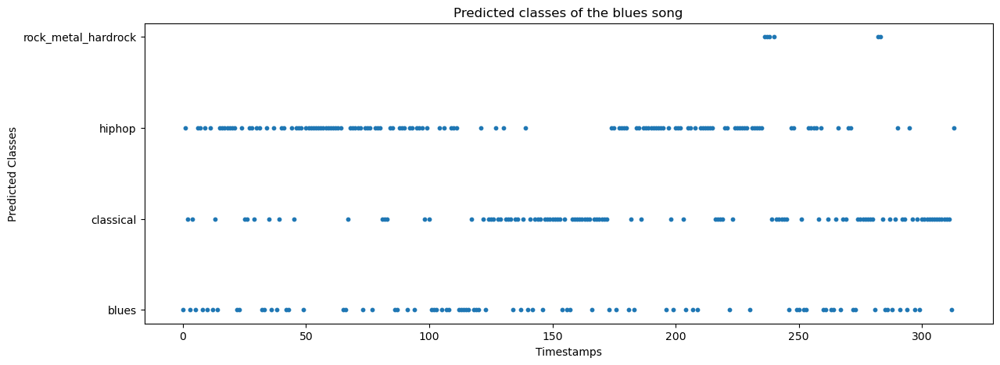

The mainly predicted class is hiphop



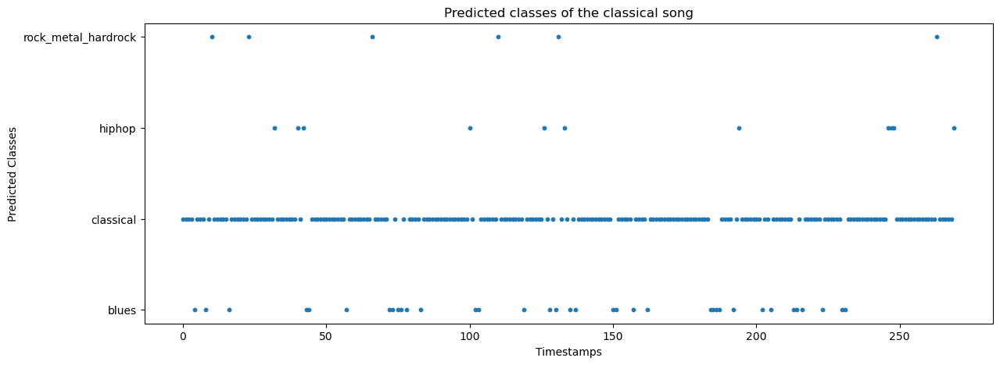

The mainly predicted class is classical



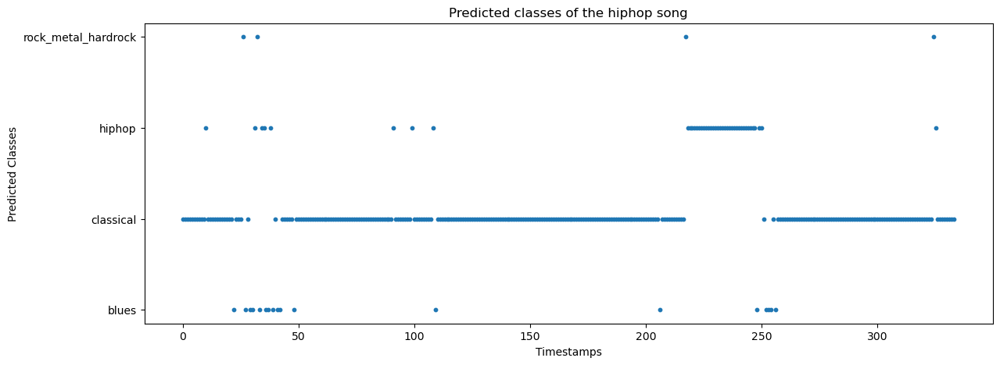

The mainly predicted class is classical



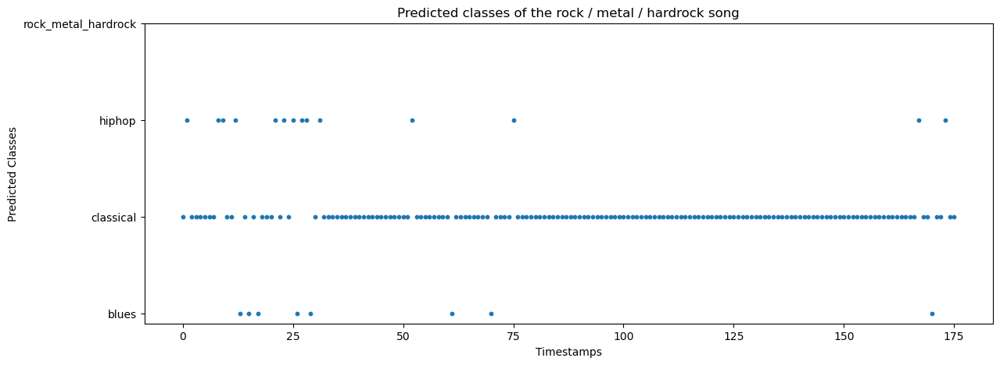

The mainly predicted class is classical



In [123]:

#* Step 3: Predicting the classes of the real world testing data

# For this, we will be using the inference function defined in step 1.
# We will, also, plot a diagram showing the predicted classes in the vertical axis and the timestamps in the horizontal axis.
# We will repeat this process, at least, 4 times, once for each genre.

# NOTE: 'data_labels' list contains these values: ['blues', 'classical', 'hiphop', 'rock_metal_hardrock']
for i, genre in enumerate(data_labels):
    youtube_dataloader = youtube_dataloader_list[i]
    
    # We predict the classes of the real world testing data
    youtube_predictions = inference(youtube_dataloader, best_model['model']) # We use the best model we have found so far
    
    # When plotting the predicted classes, it's important to understand what the classes are.
    # For this, we will match the predicted classes to the actual classes, in order to know what each class represents. We will use the 'data_labels' list for this.
    # Reminder: 0 -> 'blues', 1 -> 'classical', 2 -> 'hiphop', 3 -> 'rock_metal_hardrock'     
    
    # We plot the predicted classes in a scatter plot
    plt.figure(figsize = (14, 5))
    plt.scatter(range(len(youtube_predictions)), youtube_predictions, s = 10)
    plt.xlabel('Timestamps')
    plt.ylabel('Predicted Classes')
    # We want to represent every possible label of 'data_labels' list in the y-axis, but at the same time appropriately matching the predicted classes to the actual classes
    plt.yticks(ticks = range(len(data_labels)), labels = data_labels) # We set the y-axis ticks to be the genre names
    title_string = None
    if genre == 'rock_metal_hardrock':
        title_string = f'Predicted classes of the {genre.split("_")[0]} / {genre.split("_")[1]} / {genre.split("_")[2]} song'
    else:
        title_string = f'Predicted classes of the {genre} song'
    
    plt.title(title_string)
    plt.show()
    
    youtube_predictions = [data_labels[prediction] for prediction in youtube_predictions] # We get the predicted labels based on the indices
    
    # We get what the mainly predicted class is
    mainly_predicted_class = max(set(youtube_predictions), key = youtube_predictions.count)
    print(f'The mainly predicted class is {mainly_predicted_class}\n')
